In [1]:
import pandas as pd   
import numpy as np 
from sklearn.model_selection import train_test_split 
import matplotlib.pyplot as plt 
import seaborn as sns 
import arabic_reshaper
from bidi.algorithm import get_display
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def fa(text):
    return get_display(arabic_reshaper.reshape(str(text)))

In [2]:
data = pd.read_csv("final.csv")
data

,شهر,رتبه کشوری,رتبه در منطقه,منطقه,سابقه کانونی,میانگین تراز کانون,تعداد آزمون,رشته قبولی,دانشگاه قبولی,رشته مدرسه,سال
0,تهران,1,1.0,منطقه 1,3,7738,72.0,مهندسي کامپيوتر,دانشگاه صنعتي شريف - تهران,ریاضی,1400
1,رفسنجان,2,1.0,منطقه 2,6,7857,120.0,مهندسي کامپيوتر,دانشگاه صنعتي شريف - تهران,ریاضی,1400
2,اراك,3,2.0,منطقه 2,7,7589,142.0,مهندسي کامپيوتر,دانشگاه صنعتي شريف - تهران,ریاضی,1400
3,اراك,5,4.0,منطقه 2,3,7529,79.0,مهندسي کامپيوتر,دانشگاه صنعتي شريف - تهران,ریاضی,1400
4,مشهد,6,2.0,منطقه 1,1,7645,23.0,مهندسي کامپيوتر,دانشگاه صنعتي شريف - تهران,ریاضی,1400
...,...,...,...,...,...,...,...,...,...,...,...
73833,كنگاور,3565,990.0,منطقه 3,2,6200,69.0,دندانپزشکي,دانشگاه علوم پزشکي ايلام,تجربی,1400
73834,رباط كريم,3586,995.0,منطقه 3,7,5952,150.0,پزشکي - بورسيه وزارت دفاع,دانشگاه علوم پزشکي ارتش جمهوري اسلامي ايران,تجربی,1400
73835,اشنويه,3596,999.0,منطقه 3,3,6666,64.0,پزشکي - نيمسال دوم,دانشگاه علوم پزشکي اروميه,تجربی,1400
73836,گنبد,3596,999.0,منطقه 3,3,6474,60.0,پزشکي,دانشگاه علوم پزشکي بابل,تجربی,1400


In [3]:
data.shape

(73838, 11)

In [4]:
data.dtypes

شهر                    object
رتبه کشوری              int64
رتبه در منطقه         float64
منطقه                  object
سابقه کانونی            int64
میانگین تراز کانون      int64
تعداد آزمون           float64
رشته قبولی             object
دانشگاه قبولی          object
رشته مدرسه             object
سال                     int64
dtype: object

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73838 entries, 0 to 73837
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   شهر                 73838 non-null  object 
 1   رتبه کشوری          73838 non-null  int64  
 2   رتبه در منطقه       73838 non-null  float64
 3   منطقه               73838 non-null  object 
 4   سابقه کانونی        73838 non-null  int64  
 5   میانگین تراز کانون  73838 non-null  int64  
 6   تعداد آزمون         73838 non-null  float64
 7   رشته قبولی          73838 non-null  object 
 8   دانشگاه قبولی       73838 non-null  object 
 9   رشته مدرسه          73838 non-null  object 
 10  سال                 73838 non-null  int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 6.2+ MB


In [6]:
data.isna().sum()

شهر                   0
رتبه کشوری            0
رتبه در منطقه         0
منطقه                 0
سابقه کانونی          0
میانگین تراز کانون    0
تعداد آزمون           0
رشته قبولی            0
دانشگاه قبولی         0
رشته مدرسه            0
سال                   0
dtype: int64

In [7]:
data.describe()

,رتبه کشوری,رتبه در منطقه,سابقه کانونی,میانگین تراز کانون,تعداد آزمون,سال
count,73838.000000,73838.000000,73838.000000,73838.000000,73838.000000,73838.000000
mean,2672.840746,698.594938,2.291584,6514.482800,37.974783,1395.343685
std,2528.303374,767.619912,1.500203,692.877897,25.778463,2.623654
min,1.000000,1.000000,1.000000,0.000000,0.000000,1390.000000
25%,768.000000,209.000000,1.000000,6058.000000,19.000000,1393.000000
50%,1786.500000,493.000000,2.000000,6572.000000,32.000000,1395.000000
75%,3836.750000,849.000000,3.000000,6987.000000,50.000000,1397.000000
max,18255.000000,5426.000000,13.000000,8693.000000,239.000000,1400.000000


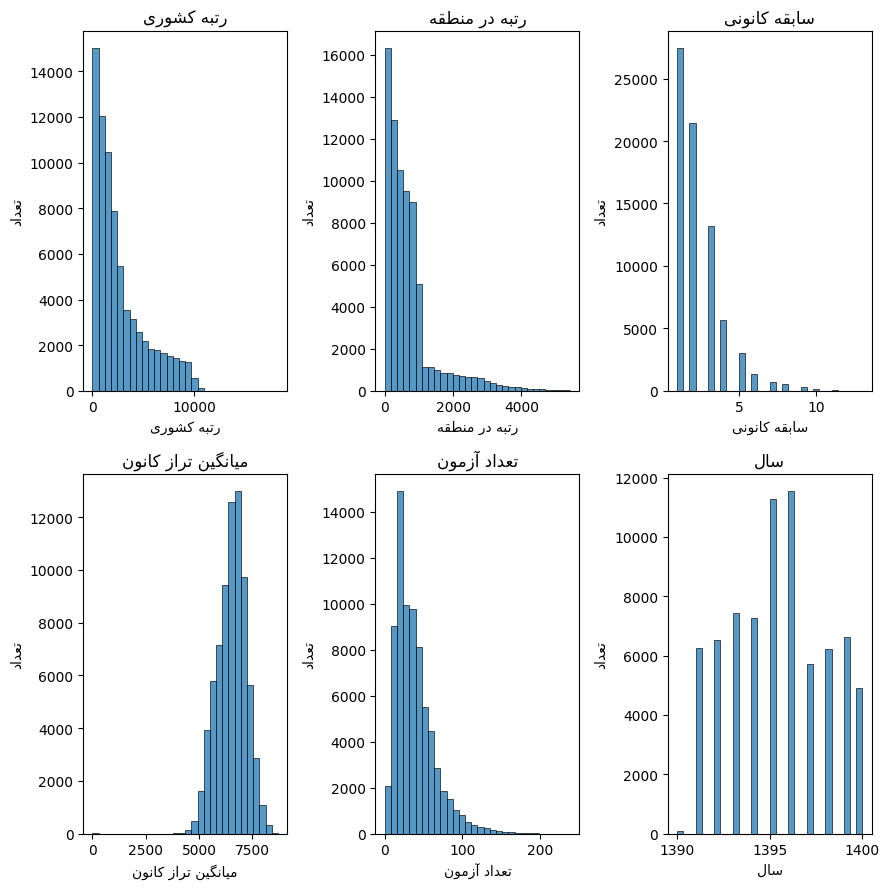

In [8]:
numeric_cols = data.select_dtypes(include=np.number).columns

fig, axes = plt.subplots(
    nrows=(len(numeric_cols) + 2) // 3,
    ncols=3,
    figsize=(9, 9)
)

axes = np.array(axes).reshape(-1)

for i, col in enumerate(numeric_cols):
    sns.histplot(data[col], bins=30, ax=axes[i])
    axes[i].set_title(fa(col))
    axes[i].set_xlabel(fa(col))
    axes[i].set_ylabel(fa("تعداد"))

for i in range(len(numeric_cols), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

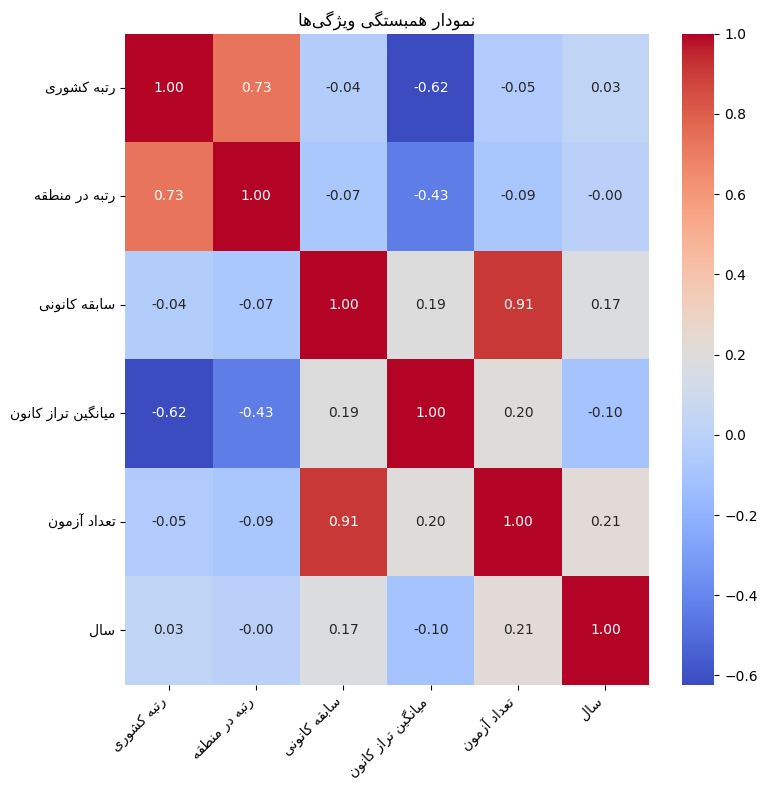

In [9]:
plt.figure(figsize=(8,8))
corr = data.corr(numeric_only=True)
labels = [fa(x) for x in corr.columns]

sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    xticklabels=labels,
    yticklabels=labels
)

plt.title(fa("نمودار همبستگی ویژگی‌ها"))
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

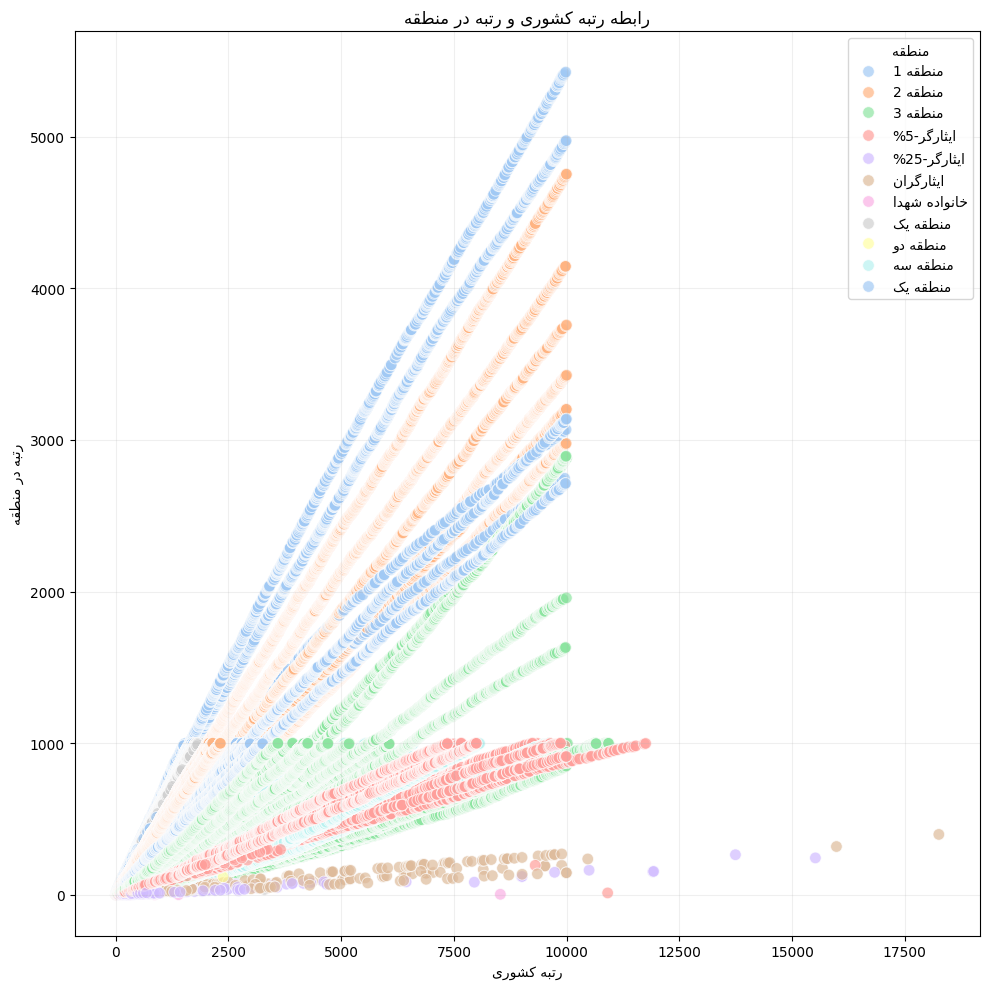

In [10]:
plt.rcParams["font.family"] = "DejaVu Sans"
plt.figure(figsize=(10,10))

sns.scatterplot(
    data=data,
    x="رتبه کشوری",
    y="رتبه در منطقه",
    hue="منطقه",
    palette="pastel",
    alpha=0.7,
    s=70
)

plt.title(fa("رابطه رتبه کشوری و رتبه در منطقه"))
plt.xlabel(fa("رتبه کشوری"))
plt.ylabel(fa("رتبه در منطقه"))

plt.grid(alpha=0.2)

legend = plt.legend(title=fa("منطقه"))

for text in legend.get_texts():
    text.set_text(fa(text.get_text()))

plt.tight_layout()
plt.show()

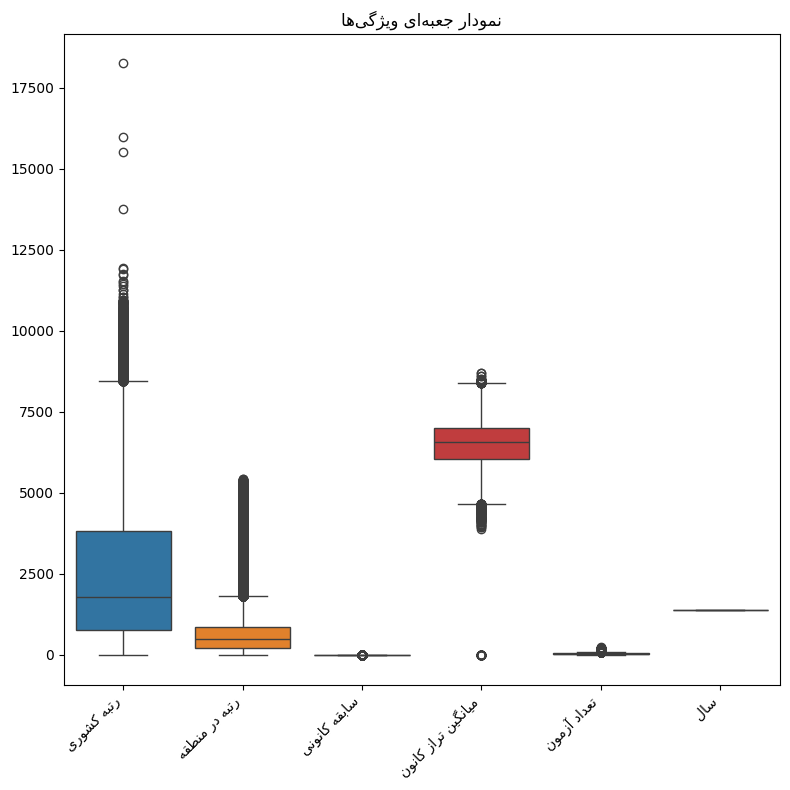

In [11]:
numeric_cols = data.select_dtypes(include=np.number).columns

plt.figure(figsize=(8,8))
sns.boxplot(data=data[numeric_cols])

plt.xticks(
    range(len(numeric_cols)),
    [fa(x) for x in numeric_cols],
    rotation=45,
    ha="right"
)

plt.title(fa("نمودار جعبه‌ای ویژگی‌ها"))
plt.tight_layout()
plt.show()

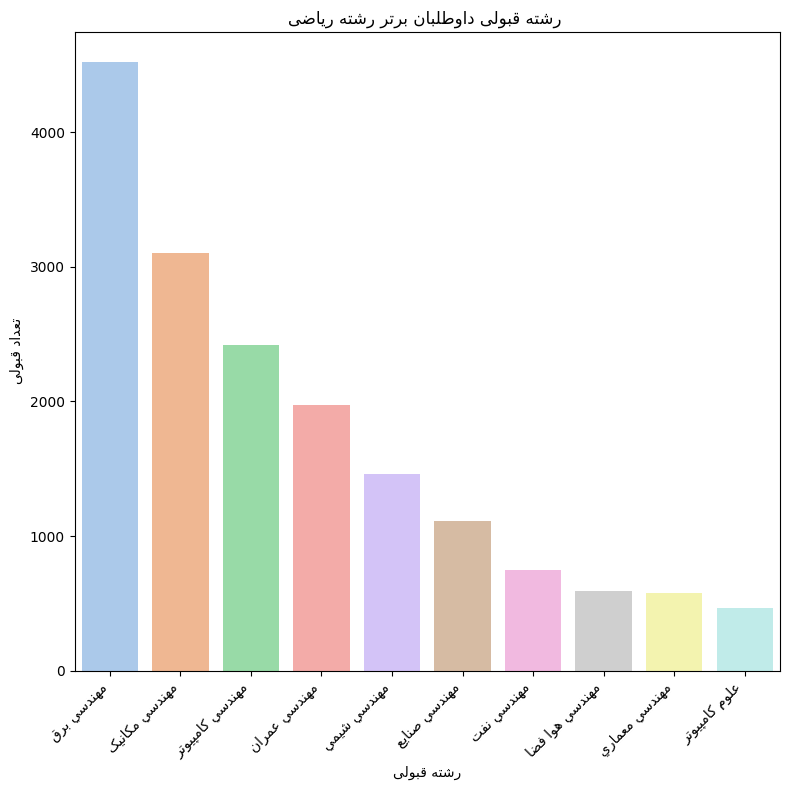

In [12]:

math_data = data[data["رشته مدرسه"] == "ریاضی"]
top_fields = math_data["رشته قبولی"].value_counts().head(10)
plt.figure(figsize=(8, 8))

sns.barplot(
    x=[fa(x) for x in top_fields.index],
    y=top_fields.values,
    hue=[fa(x) for x in top_fields.index],
    legend=False,
    palette="pastel"
)

plt.title(fa(" رشته قبولی داوطلبان برتر رشته ریاضی"))
plt.xlabel(fa("رشته قبولی"))
plt.ylabel(fa("تعداد قبولی"))

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [13]:
experimental_data = data[data["رشته مدرسه"] == "ریاضی"]
total_experimental = len(experimental_data)
acceptance = experimental_data["رشته قبولی"].value_counts().head(10)
acceptance_percent = (acceptance / total_experimental * 100).round(2)

result = pd.DataFrame({
    "تعداد قبولی": acceptance,
    "درصد از کل داوطلبان ریاضی": acceptance_percent
})

print("Total:", total_experimental)
display(result)

Total: 21451


,تعداد قبولی,درصد از کل داوطلبان ریاضی
رشته قبولی,,
مهندسي برق,4517,21.06
مهندسي مکانيک,3105,14.47
مهندسي کامپيوتر,2417,11.27
مهندسي عمران,1973,9.20
مهندسي شيمي,1461,6.81
مهندسي صنايع,1109,5.17
مهندسي نفت,749,3.49
مهندسي هوا فضا,590,2.75
مهندسي معماري,580,2.70


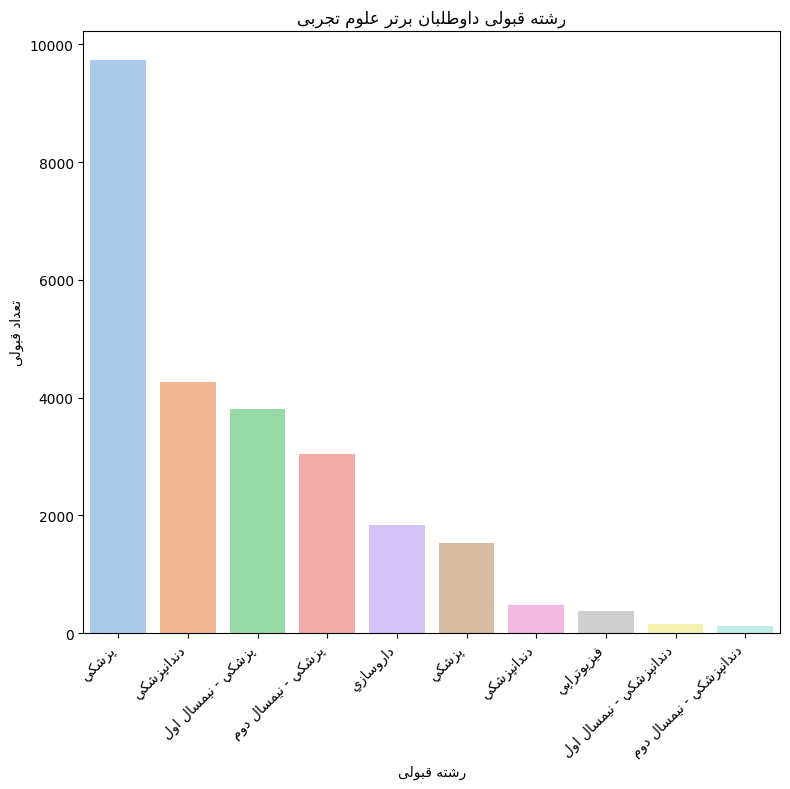

In [14]:
experimental_data = data[data["رشته مدرسه"] == "تجربی"]
top_fields = experimental_data["رشته قبولی"].value_counts().head(10)

plt.figure(figsize=(8,8))

sns.barplot(
    x=[fa(x) for x in top_fields.index],
    y=top_fields.values,
    hue=[fa(x) for x in top_fields.index],
    legend=False,
    palette="pastel"
)

plt.title(fa("رشته قبولی داوطلبان برتر علوم تجربی"))
plt.xlabel(fa("رشته قبولی"))
plt.ylabel(fa("تعداد قبولی"))

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [15]:
experimental_data = data[data["رشته مدرسه"] == "تجربی"]
total_experimental = len(experimental_data)
acceptance = experimental_data["رشته قبولی"].value_counts().head(10)
acceptance_percent = (acceptance / total_experimental * 100).round(2)

result = pd.DataFrame({
    "تعداد قبولی": acceptance,
    "درصد از کل داوطلبان تجربی": acceptance_percent
})

print("Total:", total_experimental)
display(result)

Total: 27369


,تعداد قبولی,درصد از کل داوطلبان تجربی
رشته قبولی,,
پزشکي,9738,35.58
دندانپزشکي,4257,15.55
پزشکي - نيمسال اول,3805,13.90
پزشکي - نيمسال دوم,3044,11.12
داروسازي,1836,6.71
پزشكي,1526,5.58
دندانپزشكي,473,1.73
فيزيوتراپي,369,1.35
دندانپزشکي - نيمسال اول,151,0.55


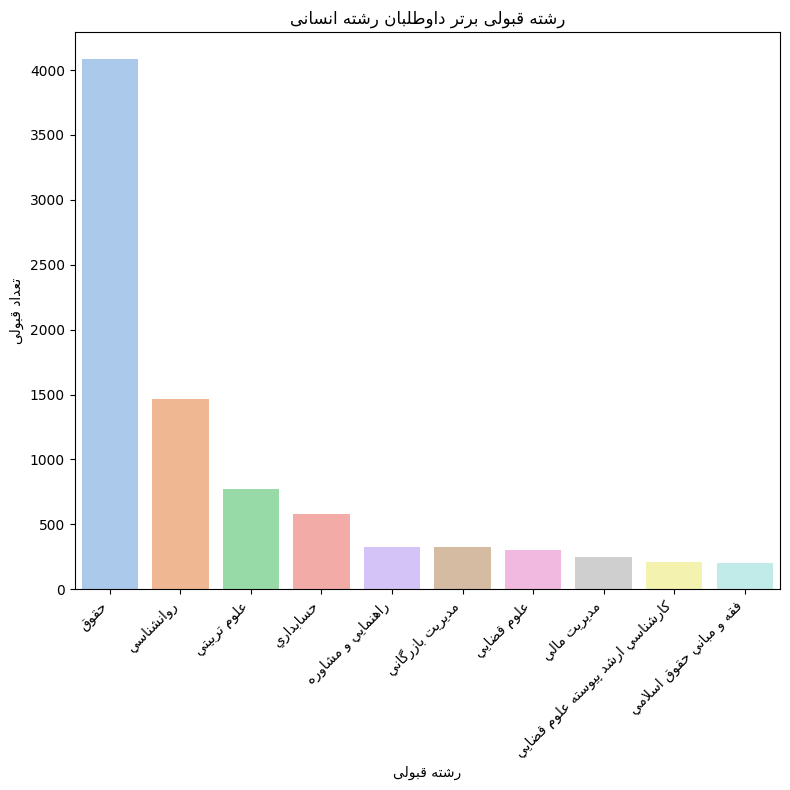

In [16]:
experimental_data = data[data["رشته مدرسه"] == "انسانی"]
top_fields = experimental_data["رشته قبولی"].value_counts().head(10)

plt.figure(figsize=(8,8))

sns.barplot(
    x=[fa(x) for x in top_fields.index],
    y=top_fields.values,
    legend=False,
    hue=[fa(x) for x in top_fields.index],
    palette="pastel"
)

plt.title(fa("رشته قبولی برتر داوطلبان رشته انسانی"))
plt.xlabel(fa("رشته قبولی"))
plt.ylabel(fa("تعداد قبولی"))

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [17]:
experimental_data = data[data["رشته مدرسه"] == "انسانی"]
total_experimental = len(experimental_data)
acceptance = experimental_data["رشته قبولی"].value_counts().head(10)
acceptance_percent = (acceptance / total_experimental * 100).round(2)

result = pd.DataFrame({
    "تعداد قبولی": acceptance,
    "درصد از کل داوطلبان انسانی": acceptance_percent
})

print("Total:", total_experimental)
display(result)

Total: 15702


,تعداد قبولی,درصد از کل داوطلبان انسانی
رشته قبولی,,
حقوق,4089,26.04
روانشناسي,1469,9.36
علوم تربيتي,772,4.92
حسابداري,578,3.68
راهنمايي و مشاوره,328,2.09
مديريت بازرگاني,322,2.05
علوم قضايي,301,1.92
مديريت مالي,248,1.58
کارشناسي ارشد پيوسته علوم قضايي,210,1.34


In [18]:
df = data.copy()
df = df.dropna(subset=["رشته قبولی", "دانشگاه قبولی"])
df["رشته و دانشگاه"] = (df["رشته قبولی"].astype(str) + " | " +df["دانشگاه قبولی"].astype(str))

pastel_colors = [
    "#A8DADC",
    "#BDE0FE",
    "#CDB4DB",
    "#FFC8DD",
    "#FFAFCC",
    "#CAFFBF",
    "#FDFFB6",
    "#B8E0D2",
    "#D8E2DC",
    "#E2CFC4"
]

pastel_scale = [
    "#E8F1F2",
    "#D8E2DC",
    "#BDE0FE",
    "#CDB4DB",
    "#FFC8DD",
    "#FFAFCC"
]

pastel_layout = dict(
    template="plotly_white",
    font=dict(
        family="Vazirmatn, Arial",
        size=14,
        color="#4A4A4A"
    ),
    paper_bgcolor="#FFFDFC",
    plot_bgcolor="#FFFDFC",
    title_font=dict(
        size=24,
        color="#3D405B"
    ),
    margin=dict(
        l=70,
        r=50,
        t=90,
        b=70
    ),
    hoverlabel=dict(
        bgcolor="white",
        font_size=13,
        font_color="#444444"
    )
)

fig = make_subplots(
    rows=2,
    cols=2,
    specs=[
        [{"type": "indicator"}, {"type": "indicator"}],
        [{"type": "indicator"}, {"type": "indicator"}]
    ],
    vertical_spacing=0.25,
    horizontal_spacing=0.12
)

fig.add_trace(
    go.Indicator(
        mode="number",
        value=len(df),
        title={"text": "تعداد کل قبولی‌ها"}
    ),
    row=1,
    col=1
)

fig.add_trace(
    go.Indicator(
        mode="number",
        value=df["رشته قبولی"].nunique(),
        title={"text": "تعداد رشته‌های قبولی"}
    ),
    row=1,
    col=2
)

fig.add_trace(
    go.Indicator(
        mode="number",
        value=df["دانشگاه قبولی"].nunique(),
        title={"text": "تعداد دانشگاه‌ها"}
    ),
    row=2,
    col=1
)

fig.add_trace(
    go.Indicator(
        mode="number",
        value=df["سال"].nunique(),
        title={"text":"تعداد سال ها"}
    ),
    row=2,
    col=2
)

fig.update_layout(
    **pastel_layout,
    title="تحلیل داده‌های قبولی",
    height=600
)

fig.show()


top_major_data = (
    df["رشته قبولی"]
    .value_counts()
    .head(15)
    .sort_values()
)

fig = px.bar(
    x=top_major_data.values,
    y=top_major_data.index,
    orientation="h",
    text=top_major_data.values,
    title="محبوب‌ترین رشته‌های قبولی",
    labels={
        "x": "تعداد قبولی",
        "y": "رشته"
    },
    color=top_major_data.values,
    color_continuous_scale=pastel_scale
)

fig.update_traces(
    textposition="outside",
    hovertemplate="<b>%{y}</b><br>تعداد قبولی: %{x}<extra></extra>"
)

fig.update_layout(
    **pastel_layout,
    height=700,
    coloraxis_showscale=False,
    yaxis=dict(categoryorder="total ascending")
)

fig.show()


top_uni_data = (
    df["دانشگاه قبولی"]
    .value_counts()
    .head(15)
    .sort_values()
)

fig = px.bar(
    x=top_uni_data.values,
    y=top_uni_data.index,
    orientation="h",
    text=top_uni_data.values,
    title="محبوب‌ ترین دانشگاه‌ها",
    labels={
        "x": "تعداد قبولی",
        "y": "دانشگاه"
    },
    color=top_uni_data.values,
    color_continuous_scale=pastel_scale
)

fig.update_traces(
    textposition="outside",
    hovertemplate="<b>%{y}</b><br>تعداد قبولی: %{x}<extra></extra>"
)

fig.update_layout(
    **pastel_layout,
    height=700,
    coloraxis_showscale=False,
    yaxis=dict(categoryorder="total ascending")
)

fig.show()


combo = (
    df["رشته و دانشگاه"]
    .value_counts()
    .head(20)
    .sort_values()
)

fig = px.bar(
    x=combo.values,
    y=combo.index,
    orientation="h",
    text=combo.values,
    title="برترین ترکیب‌های رشته و دانشگاه",
    labels={
        "x": "تعداد قبولی",
        "y": "رشته و دانشگاه"
    },
    color=combo.values,
    color_continuous_scale=pastel_scale
)

fig.update_traces(
    textposition="outside",
    hovertemplate="<b>%{y}</b><br>تعداد: %{x}<extra></extra>"
)

fig.update_layout(
    **pastel_layout,
    height=850,
    coloraxis_showscale=False,
    yaxis=dict(categoryorder="total ascending")
)

fig.show()


region_major = pd.crosstab(
    df["رشته قبولی"],
    df["منطقه"]
)

top_majors = df["رشته قبولی"].value_counts().head(12).index

heat = region_major.loc[
    region_major.index.intersection(top_majors)
]

fig = px.imshow(
    heat,
    text_auto=True,
    aspect="auto",
    color_continuous_scale=pastel_scale,
    labels={
        "x": "منطقه",
        "y": "رشته قبولی",
        "color": "تعداد قبولی"
    }
)

fig.update_layout(
    **pastel_layout,
    height=750
)

fig.show()


rank_df = df.dropna(subset=["رتبه کشوری"]).copy()

rank_df["بازه رتبه"] = pd.cut(
    rank_df["رتبه کشوری"],
    bins=[
        0,
        1000,
        5000,
        10000,
        20000,
        50000,
        np.inf
    ],
    labels=[
        "1 - 1000",
        "1001 - 5000",
        "5001 - 10000",
        "10001 - 20000",
        "20001 - 50000",
        "50000+"
    ]
)

rank_counts = (
    rank_df["بازه رتبه"]
    .value_counts()
    .reindex([
        "1 - 1000",
        "1001 - 5000",
        "5001 - 10000",
        "10001 - 20000",
        "20001 - 50000",
        "50000+"
    ])
)

fig = px.bar(
    x=rank_counts.index,
    y=rank_counts.values,
    text=rank_counts.values,
    title="توزیع قبولی براساس رتبه کشوری",
    labels={
        "x": "بازه رتبه",
        "y": "تعداد قبولی"
    },
    color=rank_counts.values,
    color_continuous_scale=pastel_scale
)

fig.update_traces(
    textposition="outside"
)

fig.update_layout(
    **pastel_layout,
    height=600,
    coloraxis_showscale=False
)

fig.show()


box_df = df.dropna(subset=["رتبه کشوری"])

top_box_majors = (
    box_df["رشته قبولی"]
    .value_counts()
    .head(10)
    .index
)

box_df = box_df[
    box_df["رشته قبولی"].isin(top_box_majors)
]

fig = px.box(
    box_df,
    x="رشته قبولی",
    y="رتبه کشوری",
    color="رشته قبولی",
    points=False,
    title="توزیع رتبه کشوری در رشته‌های محبوب",
    labels={
        "رتبه کشوری": "رتبه کشوری",
        "رشته قبولی": "رشته"
    },
    color_discrete_sequence=pastel_colors
)

fig.update_layout(
    **pastel_layout,
    height=700,
    showlegend=False
)

fig.update_yaxes(
    autorange="reversed"
)

fig.show()


school_major = (
    df.groupby(["رشته مدرسه", "رشته قبولی"])
    .size()
    .reset_index(name="تعداد")
)

top_school_major = (
    school_major
    .sort_values("تعداد", ascending=False)
    .groupby("رشته مدرسه")
    .head(8)
)

fig = px.bar(
    top_school_major,
    x="رشته مدرسه",
    y="تعداد",
    color="رشته قبولی",
    barmode="stack",
    title="مسیر رشته مدرسه تا رشته قبولی",
    labels={
        "رشته مدرسه": "رشته مدرسه",
        "تعداد": "تعداد قبولی",
        "رشته قبولی": "رشته قبولی"
    },
    color_discrete_sequence=pastel_colors
)

fig.update_layout(
    **pastel_layout,
    height=750,
    legend_title="رشته قبولی"
)

fig.show()


In [20]:
df = data.dropna(subset=[
    "رتبه کشوری",
    "رتبه در منطقه",
    "میانگین تراز کانون",
    "منطقه"
]).copy()

fig = px.scatter_3d(
    df,
    x="رتبه کشوری",
    y="رتبه در منطقه",
    z="میانگین تراز کانون",
    color="منطقه",
    hover_data=[
        "رشته قبولی",
        "دانشگاه قبولی",
        "رشته مدرسه",
        "سال"
    ],
    title= "نمودار سه بعدی",
    opacity=0.65
)

fig.update_layout(
    template="plotly_white",
    width=1100,
    height=750,
    font=dict(family="Vazirmatn, Arial", size=13),
    paper_bgcolor="#D8D3D5",
    plot_bgcolor="#E410CC",
    scene=dict(
        xaxis_title="رتبه کشوری",
        yaxis_title="رتبه در منطقه",
        zaxis_title="میانگین تراز کانون"
    )
)

fig.show()